Tree trunks Project

Initialize Constant

In [1]:
from gprMax.gprMax import api
filename_g = 'treetrunk_2d'
b_scan_cnt = 90
buffer = 5

In [2]:
import math
def generate_point_on_circle(radius, x_center, y_center, angle_degrees):
    angle_radians = math.radians(angle_degrees)
    x = x_center + radius * math.cos(angle_radians)
    y = y_center + radius * math.sin(angle_radians)
    return x, y

cx = 0.73 
cy = 0.53 
cz = 0

radius = 0.25
x1,y1 = generate_point_on_circle(radius, cx, cy, angle_degrees=0) 
z1 = 0

In [3]:
import math
num_steps = b_scan_cnt
def generate_next_step_in_circular_path(x, y, z, cx, cy, cz, radius, num_steps):
    """
    Generates the next step in coordinates for a point (x, y, z) moving in a circular path.
    Parameters:
        x, y, z: Current coordinates of the point.
        cx, cy, cz: Center of the circular path.
        radius: Radius of the circular path.
        num_steps: Total number of steps in the circular path.
    Returns:
        A list of tuples representing the new coordinates [(x1, y1, z1)].
    """

    # Calculate the current angle based on the current coordinates
    dx = x - cx
    dy = y - cy
    current_angle = math.atan2(dy, dx)

    # Calculate the angle increment per step
    angle_increment = 2 * math.pi / num_steps
    # angle_increment = -2 * math.pi / num_steps

    # Calculate the new angle for the next step
    new_angle = current_angle + angle_increment

    # Calculate the new coordinates using the new angle and radius
    x_new = cx + radius * math.cos(new_angle)
    y_new = cy + radius * math.sin(new_angle)
    z_new = z + cz  # Assuming no change in the z-coordinate
    
    return x_new, y_new, z_new

radius1 = math.sqrt((x1 - cx)**2 + (y1 - cy)**2 + (z1 - cz)**2)


src_coord = []
src_coord.append((x1,y1,z1))

for i in range(0,num_steps*2):
    x1_n, y1_n, z1_n = generate_next_step_in_circular_path(x1,y1,z1,cx,cy,cz,radius1,num_steps)
    src_coord.append((x1_n,y1_n,z1_n))
    x1 = x1_n
    y1 = y1_n
    z1 = z1_n


with open('src_coord.txt', 'w') as f:
   for k,v,i in src_coord:
       f.write("{} {} {}\n".format(k,v,i))

with open('src_coord_t.txt', 'w') as f:
   for k,v,i in src_coord:
       f.write("({}, {})\n".format(k,v))


Create Input of a healthy tree

In [5]:
%%writefile treetrunk_2d.in
#title: Healthy TreeTrunk
#domain: 1.46 1.2 0.002
#dx_dy_dz: 0.002 0.002 0.002
#time_window: 25e-9

#material: 5.22 0.005 1 0 Heartwood
#material: 5.9 0.02 1 0 Inner_Sapwood
#material: 6.1 0.033 1 0 Outer_Sapwood
#material: 6.0 1 1 0 Cabdium
#material: 5.8 0 1 0 Bark

#waveform: ricker 1 1e9 my_wave

#python
import math
def generate_next_step_in_circular_path(x, y, z, cx, cy, cz, radius, num_steps):
    """
    Generates the next step in coordinates for a point (x, y, z) moving in a circular path.
    Parameters:
        x, y, z: Current coordinates of the point.
        cx, cy, cz: Center of the circular path.
        radius: Radius of the circular path.
        num_steps: Total number of steps in the circular path.
    Returns:
        A list of tuples representing the new coordinates [(x1, y1, z1)].
    """

    # Calculate the current angle based on the current coordinates
    dx = x - cx
    dy = y - cy
    current_angle = math.atan2(dy, dx)

    # Calculate the angle increment per step
    angle_increment = 2 * math.pi / num_steps
    # angle_increment = -2 * math.pi / num_steps

    # Calculate the new angle for the next step
    new_angle = current_angle + angle_increment

    # Calculate the new coordinates using the new angle and radius
    x_new = cx + radius * math.cos(new_angle)
    y_new = cy + radius * math.sin(new_angle)
    z_new = z + cz  # Assuming no change in the z-coordinate
    
    return x_new, y_new, z_new

cx = 0.73 
cy = 0.53 
cz = 0

radius = 0.25

print("#cylinder: 0.73 0.53 0 0.73 0.53 0.002 0.25 Bark")
print("#cylinder: 0.73 0.53 0 0.73 0.53 0.002 0.12 Heartwood")

# Material
print("material: 1 0 1 0 cavity")

# Cylinder
print("cylinder: 0.75 0.6 0 0.75 0.6 0.002 0.08 cavity")

# Geometry objects write
# print("geometry_objects_write: 0.03 0.03 0 1.46 1.2 0.002 treetrunk_2d")

#end_python:

Overwriting treetrunk_2d.in


A-scan Plotting

In [6]:
from tools.plot_Ascan import mpl_plot
from gprMax.receivers import Rx
%matplotlib inline

f = open("treetrunk_2d.in","a")
f.write("#hertzian_dipole: z {} {} 0 my_wave \n".format(src_coord[i][0],src_coord[i][1],src_coord[i][2]))
f.write("#rx: {} {} {} \n".format(src_coord[i+buffer][0],src_coord[i+buffer][1],src_coord[i+buffer][2]))
f.close()
api(filename_g + '.in', n=1, geometry_only=False)



=== Electromagnetic modelling software based on the Finite-Difference Time-Domain (FDTD) method 

    www.gprmax.com   __  __
     __ _ _ __  _ __|  \/  | __ ___  __
    / _` | '_ \| '__| |\/| |/ _` \ \/ /
   | (_| | |_) | |  | |  | | (_| |>  <
    \__, | .__/|_|  |_|  |_|\__,_/_/\_\
    |___/|_|
                     v3.1.6 (Big Smoke)

 Copyright (C) 2015-2023: The University of Edinburgh
 Authors: Craig Warren and Antonis Giannopoulos

 gprMax is free software: you can redistribute it and/or modify it under the
  terms of the GNU General Public License as published by the Free Software
  Foundation, either version 3 of the License, or (at your option) any later
  version.
 gprMax is distributed in the hope that it will be useful, but WITHOUT ANY
  WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR
  A PARTICULAR PURPOSE.  See the GNU General Public License for more details.
 You should have received a copy of the GNU General Public License along with
  gpr

{"Rx": "type", "api": "function", "b_scan_cnt": "int", "buffer": "int", "cx": "float", "cy": "float", "cz": "int", "f": "TextIOWrapper", "filename_g": "str", "generate_next_step_in_circular_path": "function", "generate_point_on_circle": "function", "i": "int", "k": "float", "math": "module", "mpl_plot": "function", "num_steps": "int", "radius": "float", "radius1": "float", "src_coord": "list", "v": "float", "x1": "float", "x1_n": "float", "y1": "float", "y1_n": "float", "z1": "int", "z1_n": "int"}
{"Rx": "type", "api": "function", "b_scan_cnt": "int", "buffer": "int", "cx": "float", "cy": "float", "cz": "int", "f": "TextIOWrapper", "filename_g": "str", "generate_next_step_in_circular_path": "function", "generate_point_on_circle": "function", "i": "int", "k": "float", "math": "module", "mpl_plot": "function", "num_steps": "int", "radius": "float", "radius1": "float", "src_coord": "list", "v": "float", "x1": "float", "x1_n": "float", "y1": "float", "y1_n": "float", "z1": "int", "z1_n": "

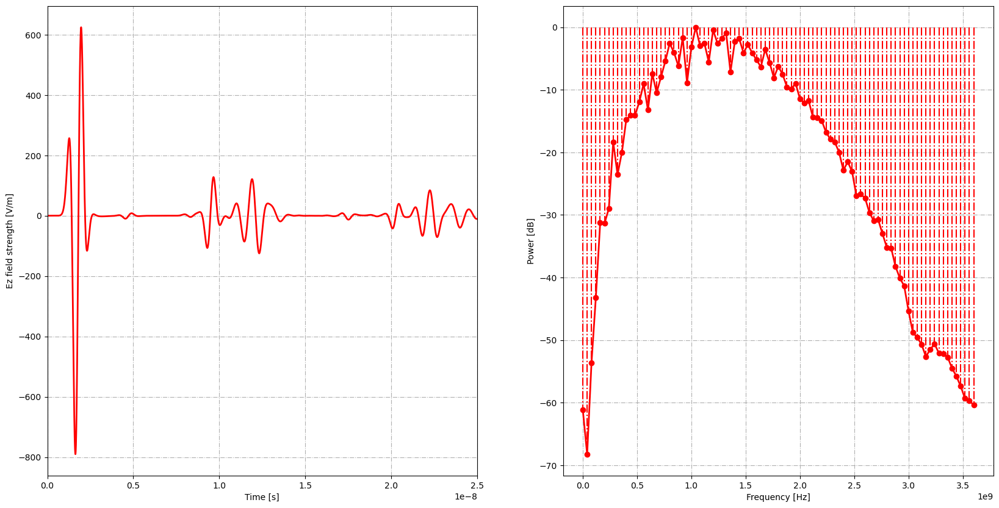

In [7]:
outputs = Rx.defaultoutputs
outputs = ['Ez']
plt = mpl_plot(filename_g + '.out', outputs, fft=True)

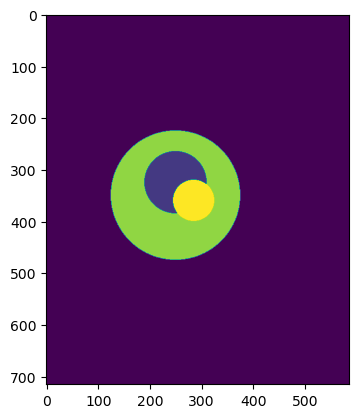

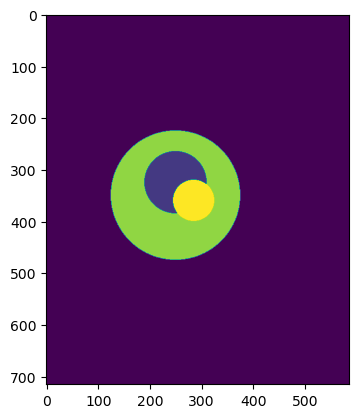

In [7]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

f = h5py.File(filename_g + '.h5', 'r')
dset = f['data']

# Generate the image
plt.imshow(dset, cmap='viridis')

# Display the image
plt.show()


In [6]:
import os
import time

for i in range(0,b_scan_cnt+1):
    if i > 0:
        os.rename('treetrunk_2d.out',f'treetrunk_2d{i}.out')
        with open('treetrunk_2d.in', 'r+') as file:
            lines = file.readlines()
            file.seek(0)
            file.truncate()
            file.writelines(lines[:-2])
            file.close()
    f = open("treetrunk_2d.in","a")
    f.write("#hertzian_dipole: z {} {} 0 my_wave \n".format(src_coord[i][0],src_coord[i][1],src_coord[i][2]))
    f.write("#rx: {} {} {} \n".format(src_coord[i+5][0],src_coord[i+5][1],src_coord[i+5][2]))
    f.close()
    api(filename_g + '.in', n=1, geometry_only=False)



=== Electromagnetic modelling software based on the Finite-Difference Time-Domain (FDTD) method 

    www.gprmax.com   __  __
     __ _ _ __  _ __|  \/  | __ ___  __
    / _` | '_ \| '__| |\/| |/ _` \ \/ /
   | (_| | |_) | |  | |  | | (_| |>  <
    \__, | .__/|_|  |_|  |_|\__,_/_/\_\
    |___/|_|
                     v3.1.6 (Big Smoke)

 Copyright (C) 2015-2023: The University of Edinburgh
 Authors: Craig Warren and Antonis Giannopoulos

 gprMax is free software: you can redistribute it and/or modify it under the
  terms of the GNU General Public License as published by the Free Software
  Foundation, either version 3 of the License, or (at your option) any later
  version.
 gprMax is distributed in the hope that it will be useful, but WITHOUT ANY
  WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR
  A PARTICULAR PURPOSE.  See the GNU General Public License for more details.
 You should have received a copy of the GNU General Public License along with
  gpr

Running simulation, model 1/1: 100%|██████| 5301/5301 [00:34<00:00, 155.07it/s]
Memory (RAM) used: ~153MB
Solving time [HH:MM:SS]: 0:00:34.185226

=== Simulation completed in [HH:MM:SS]: 0:00:34.608817 ========================

{"api": "function", "b_scan_cnt": "int", "buffer": "int", "cx": "float", "cy": "float", "cz": "int", "f": "TextIOWrapper", "file": "TextIOWrapper", "filename_g": "str", "generate_next_step_in_circular_path": "function", "generate_point_on_circle": "function", "i": "int", "k": "float", "lines": "list", "math": "module", "num_steps": "int", "os": "module", "radius": "float", "radius1": "float", "src_coord": "list", "time": "module", "v": "float", "x1": "float", "x1_n": "float", "y1": "float", "y1_n": "float", "z1": "int", "z1_n": "int"}
{"api": "function", "b_scan_cnt": "int", "buffer": "int", "cx": "float", "cy": "float", "cz": "int", "f": "TextIOWrapper", "file": "TextIOWrapper", "filename_g": "str", "generate_next_step_in_circular_path": "function", "generate_p

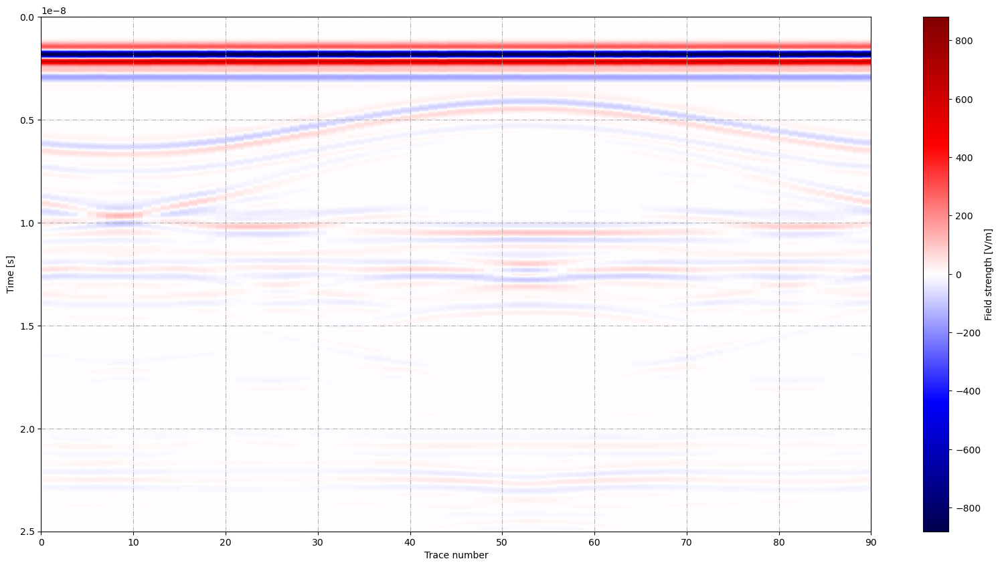

In [1]:
from tools.outputfiles_merge import merge_files
merge_files("treetrunk_2d", False)
from tools.plot_Bscan import get_output_data, mpl_plot
%matplotlib inline

rxnumber = 1
rxcomponent = 'Ez'
outputdata, dt = get_output_data(
    "treetrunk_2d" + '_merged.out', rxnumber, rxcomponent)
plt = mpl_plot('treetrunk_2d_merged.out', outputdata, dt, rxnumber, rxcomponent)

# # Change from the default 'seismic' colormap
# plt.set_cmap('gray')


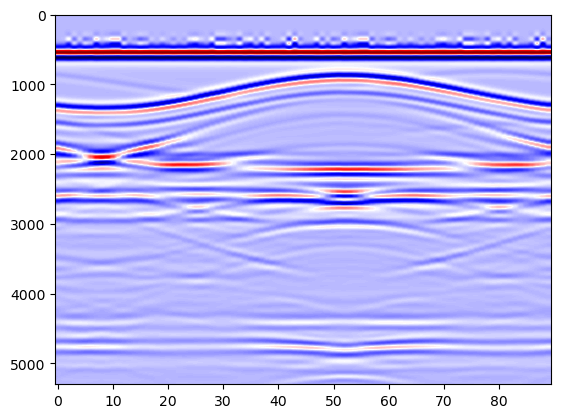

In [4]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

file_names = ['treetrunk_2d_merged.out']
Ez_list = []

# Load the data from each file
for file_name in file_names:
    with h5py.File(file_name, 'r') as f:
        Ez = f['rxs']['rx1']['Ez'][()]
        Ez_list.append(Ez)

with h5py.File('cir_src_only.out', 'r') as f0:
    Ez0 = f0['rxs']['rx1']['Ez'][()]

src = Ez0[:,np.newaxis]
# src = Ez0[:, np.newaxis]  # Add a new axis

# Ez0 = np.repeat(src, b_scan_cnt, axis=1)

# Compute the differences relative to the first file
Ez_diff_list = [np.subtract(Ez, Ez0) for Ez in Ez_list]

Ez = np.concatenate(Ez_diff_list, axis=1)

plt.imshow(Ez, cmap='seismic', aspect='auto')
# plt.set_cmap('gray')

